# DATA LOADING

In [1]:
import warnings
# To ignore all warnings
warnings.filterwarnings("ignore")

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torchvision.transforms as transforms
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler


In [3]:
import idx2numpy

def load_and_reshape_idx(file_path, is_image=True):
    """
    Load and reshape IDX file data.

    Parameters:
    file_path (str): Path to the IDX file.
    is_image (bool): Whether the file contains image data. If True, the data will be reshaped.

    Returns:
    np.ndarray: Loaded and optionally reshaped data.
    """
    # Load the data using idx2numpy
    data = idx2numpy.convert_from_file(file_path)
    
    # Reshape the data if it is image data
    if is_image:
        num_images, rows, cols = data.shape
        data = data.reshape(num_images, rows * cols)
    
    return data

# Load the training data
train_images = load_and_reshape_idx("data/train-images-idx3-ubyte", is_image=True)
train_labels = load_and_reshape_idx("data/train-labels-idx1-ubyte", is_image=False)

# Load the test data
test_images = load_and_reshape_idx("data/t10k-images-idx3-ubyte", is_image=True)
test_labels = load_and_reshape_idx("data/t10k-labels-idx1-ubyte", is_image=False)

print("Training images shape:", train_images.shape)
print("Training labels shape:", train_labels.shape)
print("Test images shape:", test_images.shape)
print("Test labels shape:", test_labels.shape)

Training images shape: (60000, 784)
Training labels shape: (60000,)
Test images shape: (10000, 784)
Test labels shape: (10000,)


# PREPROCESSING

In [4]:
print("len(train_images):", len(train_images))
print("len(train_labels):", len(train_labels))

len(train_images): 60000
len(train_labels): 60000


In [5]:
# Split training data into training and validation sets (80% training, 20% validation)
train_images, val_images, train_labels, val_labels = train_test_split(train_images, train_labels, test_size=0.2, random_state=42)

print("Training set size:", len(train_images))
print("Validation set size:", len(val_images))

Training set size: 48000
Validation set size: 12000


In [6]:
# Normalize the image data
scaler = MinMaxScaler()
train_images_scaled = scaler.fit_transform(train_images)
val_images_scaled = scaler.transform(val_images)
test_images_scaled = scaler.transform(test_images)

In [7]:
train_images_scaled

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [9]:
# Drop and Rotation if possible and necessary...
# Define data augmentation
data_augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.RandomResizedCrop(28)
])

## **Visulization using UMAP**

### **What is UMAP?**
UMAP (Uniform Manifold Approximation and Projection) is a dimensionality reduction technique that is particularly effective for visualizing high-dimensional data. It is based on manifold learning techniques and topological data analysis.

### **When to Use UMAP**
- **Visualization**: UMAP is commonly used to visualize high-dimensional data in 2D or 3D space.
- **Preprocessing**: It can be used as a preprocessing step to reduce the dimensionality of data before applying other machine learning algorithms.
- **Clustering**: UMAP can help in identifying clusters in the data by projecting it into a lower-dimensional space where clusters are more apparent.

### **Why Use UMAP**
- **Preserves Local and Global Structure**: UMAP is designed to preserve both the local and global structure of the data, making it effective for visualizing complex datasets.
- **Speed and Scalability**: UMAP is faster and more scalable compared to other dimensionality reduction techniques like t-SNE.
- **Flexibility**: It can handle a variety of data types and is flexible in terms of the distance metrics it can use.

### **Application to Fashion MNIST**
Fashion MNIST is a dataset of Zalando's article images, consisting of 60,000 training examples and 10,000 test examples. Each example is a 28x28 grayscale image, associated with a label from 10 classes.

Using UMAP on Fashion MNIST can help in visualizing the high-dimensional pixel data in a 2D space, making it easier to understand the distribution and clustering of different fashion items.

### **Example Code Explanation**
The provided code snippet applies UMAP to the Fashion MNIST dataset:

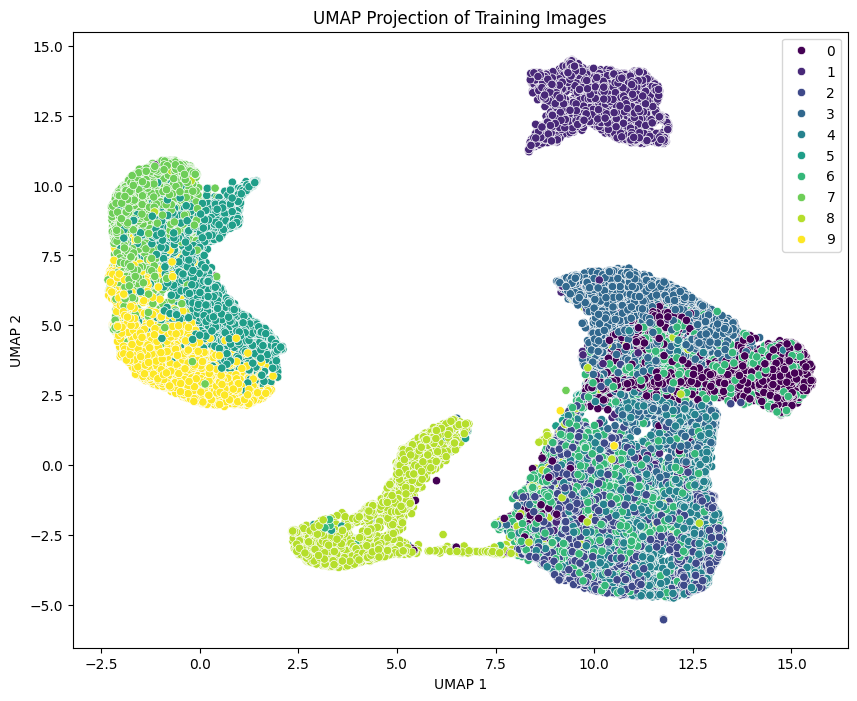

In [10]:
# pip install umap-learn
# pip uninstall numpy
# pip install numpy==1.26.4

# if error
# pip install wheel
# pip install setuptools
# pip install --upgrade setuptools
import umap.umap_ as umap

# Apply UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
train_images_umap = reducer.fit_transform(train_images_scaled)

# Visualize the results
plt.figure(figsize=(10, 8))
sns.scatterplot(x=train_images_umap[:, 0], y=train_images_umap[:, 1], hue=train_labels, palette='viridis', legend='full')
plt.title('UMAP Projection of Training Images')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

- **Created DataFrame**: Created a DataFrame df to store the 2D UMAP projections and their corresponding class labels.
- **Replaced Class Labels**: Replaced numeric class labels with descriptive names (e.g., 'T-shirt/top', 'Trouser', etc.) for better readability.
- **Visualized Results**: Used Seaborn to create a scatter plot of the UMAP projections with vibrant colors, enhancing the visual distinction between different classes.

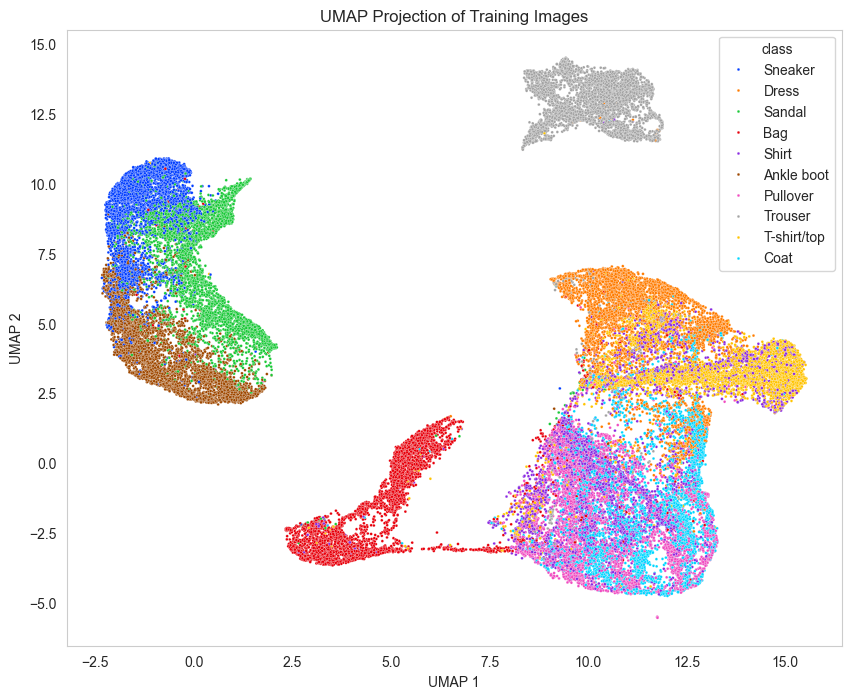

In [12]:
# Apply UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
train_images_umap = reducer.fit_transform(train_images_scaled)

# Create DataFrame
df = pd.DataFrame(train_images_umap, columns=('x', 'y'))
df["class"] = train_labels

# Replace Class Labels
labels = {0: 'T-shirt/top', 1: 'Trouser', 2: 'Pullover', 3: 'Dress', 4: 'Coat', 
          5: 'Sandal', 6: 'Shirt', 7: 'Sneaker', 8: 'Bag', 9: 'Ankle boot'}
df["class"].replace(labels, inplace=True)

# Visualize the results with vibrant colors
sns.set_style("whitegrid", {'axes.grid': False})
palette = sns.color_palette("bright", 10)  # Use a bright color palette
plt.figure(figsize=(10, 8))
sns.scatterplot(x="x", y="y", hue="class", palette=palette, data=df, legend='full', s=4)
plt.title('UMAP Projection of Training Images')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

- **Using pairplot**

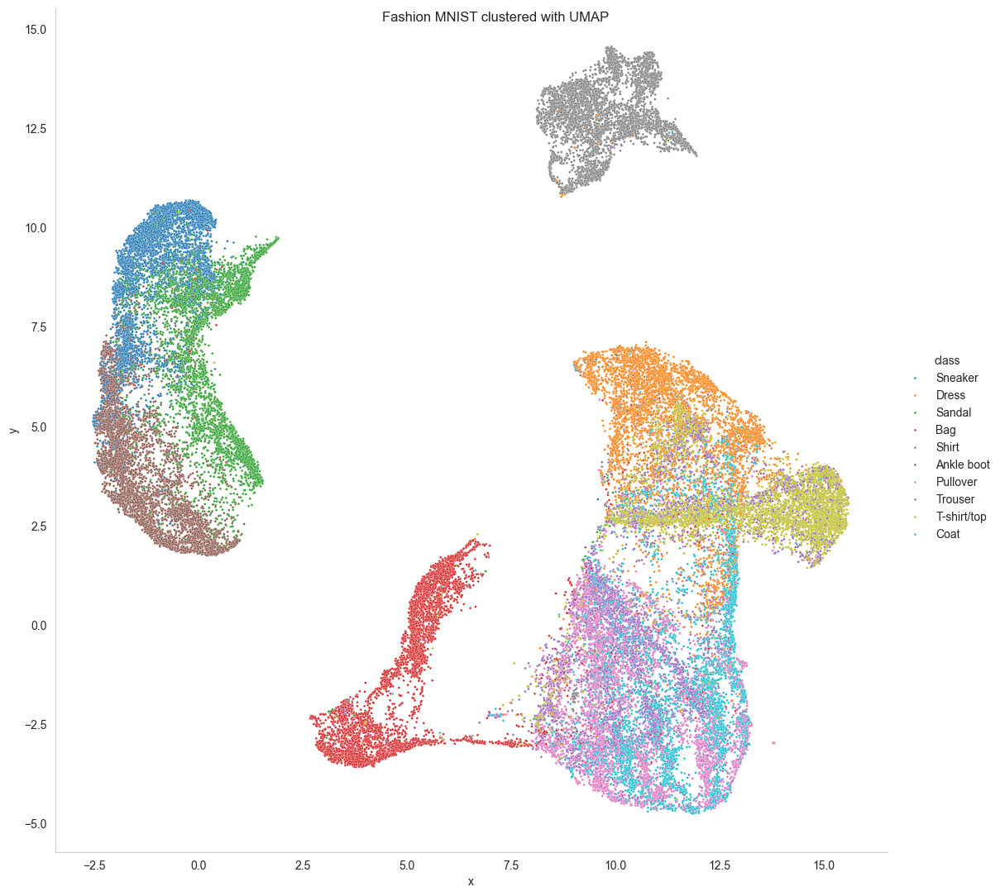

In [11]:
# Step 1: Apply UMAP
reduce = umap.UMAP(random_state=223)  # Just for reproducibility
embedding = reduce.fit_transform(train_images_scaled)

# Step 2: Create DataFrame
df = pd.DataFrame(embedding, columns=('x', 'y'))
df["class"] = train_labels

# Step 3: Replace Class Labels
labels = {0: 'T-shirt/top', 1: 'Trouser', 2: 'Pullover', 3: 'Dress', 4: 'Coat', 
          5: 'Sandal', 6: 'Shirt', 7: 'Sneaker', 8: 'Bag', 9: 'Ankle boot'}
df["class"].replace(labels, inplace=True)

# Step 4: Visualize the reduced DataFrame
sns.set_style("whitegrid", {'axes.grid': False})
ax = sns.pairplot(x_vars=["x"], y_vars=["y"], data=df, hue="class", height=11, plot_kws={"s": 4})
ax.fig.suptitle('Fashion MNIST clustered with UMAP')
plt.show()

**Differences Between the Two Plots**
1. **Scatter Plot**:

  - Visualization Tool: sns.scatterplot
  - Appearance: Displays individual points in a 2D space with vibrant colors for each class.
  - Use Case: Effective for visualizing the overall distribution and clustering of data points.

2. **Pair Plot**:

  - Visualization Tool: sns.pairplot
  - Appearance: Displays a grid of scatter plots for each pair of variables (in this case, just x and y), with different colors for each class.
  - Use Case: Useful for comparing distributions and relationships between multiple variables, even though in this case it only shows one pair (x and y).


**Similarities**
- Both plots use UMAP to reduce the dimensionality of the Fashion MNIST dataset.
- Both plots replace numeric class labels with descriptive names.
- Both plots use Seaborn for visualization and apply a similar color palette for class distinction.

In [9]:
# pip install plotly

import umap.umap_ as umap
import plotly.express as px

# Apply UMAP
reducer = umap.UMAP(n_components=3, random_state=42)
train_images_umap = reducer.fit_transform(train_images_scaled)

# Create DataFrame
df = pd.DataFrame(train_images_umap, columns=('x', 'y', 'z'))
df["class"] = train_labels

# Replace Class Labels
labels = {0: 'T-shirt/top', 1: 'Trouser', 2: 'Pullover', 3: 'Dress', 4: 'Coat', 
          5: 'Sandal', 6: 'Shirt', 7: 'Sneaker', 8: 'Bag', 9: 'Ankle boot'}
df["class"].replace(labels, inplace=True)

# Visualize the results with vibrant colors in 3D
fig = px.scatter_3d(df, x='x', y='y', z='z', color='class', title='UMAP Projection of Training Images in 3D',
                    color_discrete_sequence=px.colors.qualitative.Bold)
fig.update_traces(marker=dict(size=3))

# pip install nbformat --upgrade
fig.show()

In [10]:
from ast import literal_eval
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import umap.umap_ as umap
import pandas as pd
import numpy as np

# Apply UMAP
reducer = umap.UMAP(n_components=3, random_state=42)
train_images_umap = reducer.fit_transform(train_images_scaled)

# Create DataFrame
df = pd.DataFrame(train_images_umap, columns=('x', 'y', 'z'))
df["class"] = train_labels

# Replace Class Labels
labels = {0: 'T-shirt/top', 1: 'Trouser', 2: 'Pullover', 3: 'Dress', 4: 'Coat', 
          5: 'Sandal', 6: 'Shirt', 7: 'Sneaker', 8: 'Bag', 9: 'Ankle boot'}
df["class"].replace(labels, inplace=True)

# Define colors
colors = ['rgb(0,31,63)', 'rgb(255,133,27)', 'rgb(255,65,54)', 'rgb(0,116,217)', 'rgb(133,20,75)', 'rgb(57,204,204)',
          'rgb(240,18,190)', 'rgb(46,204,64)', 'rgb(1,255,112)', 'rgb(255,220,0)',
          'rgb(76,114,176)', 'rgb(85,168,104)', 'rgb(129,114,178)', 'rgb(100,181,205)']

# Create 3D scatter plot
data_graph = []
for no, name in enumerate(np.unique(df["class"])):
    graph = go.Scatter3d(
        x=df[df["class"] == name]["x"],
        y=df[df["class"] == name]["y"],
        z=df[df["class"] == name]["z"],
        name=name,
        mode='markers',
        marker=dict(
            size=12,
            line=dict(
                color='#%02x%02x%02x' % literal_eval(colors[no][3:]),
                width=0.5
            ),
            opacity=0.5
        )
    )
    data_graph.append(graph)

layout = go.Layout(
    scene=dict(
        camera=dict(
            eye=dict(
                x=0.5,
                y=0.5,
                z=0.5
            )
        )
    ),
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)

fig = go.Figure(data=data_graph, layout=layout)
py.iplot(fig, filename='3d-scatter')

### Summary

The code in `visualization_umap.ipynb` demonstrates how to use UMAP (Uniform Manifold Approximation and Projection) to create 2D and 3D visualizations of the Fashion MNIST dataset. The process involves the following steps:

1. **Install and Import Libraries**: Ensure the necessary libraries (`umap-learn`, `pandas`, `seaborn`, `matplotlib`, and `plotly`) are installed and imported.

2. **Apply UMAP**: Use UMAP to reduce the dimensionality of the scaled training images to 2D and 3D embeddings.

3. **Create DataFrame**: Convert the UMAP embeddings to Pandas DataFrames, adding the class labels for visualization.

4. **Replace Class Labels**: Replace numeric class values with descriptive fashion labels for better interpretability.

5. **Visualize in 2D**: Use `seaborn` to create a 2D scatter plot of the UMAP-transformed data, coloring the points by their class labels using a vibrant color palette.

6. **Visualize in 3D**: Use `plotly` to create an interactive 3D scatter plot of the UMAP-transformed data, coloring the points by their class labels. The code snippet provided in the active file creates a 3D scatter plot with the following features:
   - **Scatter Plot**: Each class is represented by a different color, and the points are plotted in 3D space.
   - **Marker Customization**: Markers are customized with size, line color, and opacity to enhance visual clarity.
   - **Camera Settings**: The camera position is set to provide a clear view of the 3D plot.
   - **Layout Settings**: The layout is adjusted to remove margins and provide a clean visualization.

### Purpose

- **Dimensionality Reduction**: UMAP reduces the dimensionality of high-dimensional data while preserving the global structure and local relationships.
- **Visualization**: By reducing the data to 2D or 3D, UMAP makes it easier to visualize and understand complex datasets.
- **Interactive Exploration**: Using `plotly` for 3D visualization allows for interactive exploration of the data, providing deeper insights into the relationships between different classes.

### Why Use This?

- **Preserve Data Structure**: UMAP preserves both the global structure and local relationships in the data, making it a powerful tool for dimensionality reduction.
- **Ease of Use**: UMAP is easy to use and integrates well with popular data science libraries like `pandas`, `seaborn`, and `plotly`.
- **Enhanced Interpretability**: Adding descriptive class labels and using vibrant color palettes enhances the interpretability of the visualizations.
- **Interactive Visualization**: The interactive 3D scatter plot created with `plotly` allows users to explore the data from different angles and gain a better understanding of the relationships between different classes.

This approach is particularly useful for visualizing complex datasets like Fashion MNIST, where understanding the relationships between different classes can provide valuable insights. The combination of 2D and 3D visualizations helps in gaining a comprehensive understanding of the data structure.